In the previous version of this notebook we generated DataFrames for each cell under one "genotype", where the data consisted of input R, series R, and peak EPSC amplitude per presynaptic stimulation under a voltage clamp protocol. However, the bulk of the data exists as intermingled experiments of either voltage or current clamp. Also, some of the individual folders that would correspond to a single cell are actually 2, since there were some simultaneous recordings saved as another abf.sweep'Y' channel (with another name probably). *This version will use the provided .csv files that contain the stimulus intensities as a metadata source for selecting between VClamp and IClamp analyses, skip over any errors in recordings, and detect and extract data from files where more than 1 cell was recorded.*

__I - Instalation of libraries and listing directories of data.__ -unchanged



In [1]:
pip install --upgrade pyabf

     |████████████████████████████████| 51kB 3.0MB/s eta 0:00:01
  Created wheel for pyabf: filename=pyabf-2.2.5-cp37-none-any.whl size=47481 sha256=aa9b98a212572e72c3a02d7526f403288169cc9f7baa7408d94e82e785e8220a
  Stored in directory: /Users/adrianalejandro/Library/Caches/pip/wheels/73/b7/23/1b5919c01a5595ab64894e94cea6eddc93382fe9a17d43b203
Successfully built pyabf
  Found existing installation: pyabf 2.2.4
    Uninstalling pyabf-2.2.4:
      Successfully uninstalled pyabf-2.2.4
Note: you may need to restart the kernel to use updated packages.


In [89]:
import pyabf
import pyabf.tools.memtest 
import matplotlib.pyplot as plt
import numpy as np
import os 
import os.path
from os import path
import csv
import pandas as pnd
from tkinter import Tk
from tkinter.filedialog import askdirectory

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

__II - Generate metadata__

In [90]:
def get_txt_metadata(mouse,contents):   
    all_header_files = []
    
    for filename in contents:
        if '.txt' not in filename and '.csv' not in filename and mouse not in filename: ###
            header_txt = filename + '_header.txt'
            header = open(header_txt,'w')
            all_header_files.append(header_txt)
            abf = pyabf.ABF(filename)
            header.write(abf.headerText)
            header.close()
    return(all_header_files)


In [91]:
def get_csv_metadata(all_header_files):
    
    csv_files = []

    for filename in all_header_files:
        if '.csv' not in filename and '.txt' in filename:
            header = open(filename,'r')
            metadata_str = []
    
            for line in header:
                if '=' in line:
                    metadata_str.append(line)
            
            csv_filename = filename.replace('.txt','.csv')
            metadata_csv = pnd.DataFrame(metadata_str)
        
            metadata_csv.columns = ['Data'] # pandas doesn't like column names to be 0 
            metadata_csv[['Data','Values']] = metadata_csv.Data.str.split(" = ",expand=True) # remove whitespaces too!!!
            metadata_csv.to_csv(csv_filename, sep=',',index=False)
            csv_files.append(csv_filename)
        
    return csv_files


In [92]:
def get_metadata_values(valid_csv,parameter):

    # Obtains raw data string associated to specified parameter in metadata.
    csv_metadata = pnd.read_csv(valid_csv)
    dic_metadata = csv_metadata.set_index('Data').to_dict()['Values'] # totally stolen from stack overflow and its FAST
    raw_str = dic_metadata[parameter] 
    return raw_str

def get_mV_step_interval(raw_str):
    # assumes only a single voltage step in voltage clamp experiments
    parsed_str = raw_str.split(', ')
    parsed_total = (len(parsed_str))
    for i in range(parsed_total):
        if '0.00' not in parsed_str[i]:
            # also stolen: this extracts string inside []
            values = parsed_str[i][parsed_str[i].find("[")+1:parsed_str[i].find("]")]
    step_points = (values.split(':'))
    step_start, step_end = int(step_points[0]), int(step_points[1])
    return step_start, step_end


__III - Measurements, Resistance, peak_pA__

In [93]:
def get_peak_pA_v2(ch_ind,abf,valid_csv):  # and timepoints!
    
    parameter = 'dataRate' # tickrate
    peak_pA = []
    peak_pA_ind = []
    peak_pA_s = []
    latency_s = []
    pre_window_s = 0.005 # seconds to look at after artifact to find real starting point for EPSC, 100 ticks
    post_window_s = 0.01 # seconds to look after the real starting point to find EPSC peak, 200 ticks
    i1, i2 = 0, 5000 # first set of wide indices
    
    for i in abf.sweepList:
        
        tickrate = float(get_metadata_values(valid_csv,parameter))
        abf.setSweep(i, channel=ch_ind)
        
        pre_window_ticks = tickrate*pre_window_s 
        post_window_ticks = tickrate*post_window_s
    
        pos_max_ind = np.argmax(abf.sweepY[i1:i2]) # huge positive artifact

        #Fake calculations to show how numbers are managed with each sum operation
        pre_window_i1 = pos_max_ind + 2
        pre_window_i2 = int(pre_window_i1 + pre_window_ticks)
        # 3100 + 2 = 3102
        # 31200 + 100 = 3202
    
        post_window_i1 = int(pre_window_i1 + (np.argmax(abf.sweepY[pre_window_i1:pre_window_i2])))
        post_window_i2 = int(post_window_i1 + post_window_ticks)
        #3102 + 25 = 3127
        #3127 + 200 = 3327

        peak = min(abf.sweepY[post_window_i1:post_window_i2])
        peak_ind = int(post_window_i1 + (np.argmin(abf.sweepY[post_window_i1:post_window_i2])))
        peak_s = peak_ind/tickrate
        latency = peak_s - (pos_max_ind/tickrate) # peak time normalized to stimulus onset (huge positive current)
        #3127 + 10 = 3137 (index of peak pA)
        
        peak_pA.append(peak)       
        peak_pA_ind.append(peak_ind) 
        peak_pA_s.append(peak_s)
        latency_s.append(latency)
    
    return peak_pA, peak_pA_ind, peak_pA_s, latency_s

In [301]:
def get_resistances_v2(ch_ind,step_start, step_end, abf):
    Rs = []
    Ri = []
    for i in abf.sweepList:
        abf.setSweep(i, channel = ch_ind) # channel = cellnum 
        neg_maxI = min(abf.sweepY[step_start:step_end]) # max current
        Input_I = abf.sweepY[step_end - 10]
        neg_max_index = int(np.argmin(abf.sweepY[step_start:step_end]) + step_start)
        abf.setSweep(i,channel= ch_ind + 1) #check if this indexes right
        SeriesR = (abf.sweepY[neg_max_index]/neg_maxI) * 1000 #convert from gigaohms to megaohms
        Rs.append(SeriesR)
        
        InputR = ((abf.sweepY[step_end -10])/Input_I) * 1000 
        Ri.append(InputR) 
        
    return Ri, Rs 

In [95]:
def get_RiRs_persweep_v2(ch_ind,valid_csv,abf):
    parameter = 'sweepEpochs' # This can be switched around if you want to use this function as a template for
                              # functions to call other parameters
    values = get_metadata_values(valid_csv,parameter)    
    step_start, step_end = get_mV_step_interval(values)
    Ri, Rs = get_resistances_v2(ch_ind,step_start, step_end, abf)
    return Ri, Rs

In [298]:
#Accesory for visualizing resistances from new function above
def plot_Rtest_v2(sweep_ind,abf,i1,i2):
    
    abf.setSweep(sweep_ind, channel = 0)
    frame_axis = range(abf.sweepPointCount)
    fig = plt.figure(figsize=(8, 4))
    
    ax1 = fig.add_subplot(211)
    ax1.set_title("Resistance test")
    ax1.plot(frame_axis[i1:i2], abf.sweepY[i1:i2])
    ax1.set_ylabel(abf.sweepLabelY)
    
    abf.setSweep(sweep_ind, channel = 1)
    ax2 = fig.add_subplot(212, sharex=ax1)
    ax2.plot(frame_axis[i1:i2], abf.sweepY[i1:i2], color='r')
    ax2.set_xlabel('data_frames')
    ax2.set_ylabel(abf.sweepLabelY)

    return fig

__IV - Functions for generating `DataFrame` with all measures above.__

`data_summary_percell` is changed to save 2 dataframes in case one folder includes 2 cells.

In [97]:
def data_summary_percell_v2(ch_ind,valid_ABFs,valid_CSVs,stim_int):
    mean_Ri = []
    mean_Rs = []
    mean_peak_pA = []
    all_peak_times = pnd.DataFrame()
    for i in range(len(valid_ABFs)): #switch with valid ABF files
        abf = pyabf.ABF(valid_ABFs[i]) 
        Ri, Rs = get_RiRs_persweep_v2(ch_ind,valid_CSVs[i],abf)
        # Get average resistances per file and save onto dataframe
        mean_Ri.append(np.mean(Ri))
        mean_Rs.append(np.mean(Rs))
    
        # Get peak amplitude of EPSC
        peak_pA, peak_pA_ind, peak_pA_s, latency_s = get_peak_pA_v2(ch_ind,abf,valid_CSVs[i])
        mean_peak_pA.append(np.mean(peak_pA))
        seg = valid_ABFs[i].strip('.abf')
        segment = [seg for j in abf.sweepList]
        sweep_num = abf.sweepList
        peak_times = pnd.DataFrame(list(zip(peak_pA_ind,peak_pA_s,latency_s,segment)), index=sweep_num, columns =  
                          ["peak_pA_frame", "peak_pA_time_(s)","peak_latency_(s)","sweep_number"])
        all_peak_times = all_peak_times.append(peak_times,ignore_index=False)
        pivot_peak_times = all_peak_times.pivot(index=all_peak_times.index, columns='sweep_number') # Tidy the data by sweep number :)
        
        i1 = 3250 #arbitrary indices to choose limits on x axis of traces, can be changed to replace saved figures if run again
        i2 = 3700
        fig = plot_mean_sweep_with_vline(valid_ABFs[i],ch_ind,i1,i2,peak_pA_s)
        
    cell_df = pnd.DataFrame(list(zip(stim_int, mean_Ri, mean_Rs, mean_peak_pA)), index=valid_ABFs, columns =  
                          ["stimulus_intensity_uA", "Input_Resistance_MOhm", "Series_Resistance_MOhm",
                           'Peak_amplitude_pA'])                       
    
    return cell_df , pivot_peak_times, fig

In [323]:
def get_xlxs_data(mouse,contents): 
    for file in contents:
        if mouse in file: #experimental notes file is the only one in each mouse folder with the name of that mouse
            segment_file = file
            print(segment_file)
            exp_notes = pnd.read_excel(segment_file)
            stim_int = exp_notes['Stim Intensity (uA)'].tolist()
            stim_int.pop(0)
            cellnum = exp_notes['cellnum']
            cellnum = int(cellnum[0]) 
            valid_ABFs = exp_notes['File'].tolist()
            valid_ABFs.pop(0)
            for x in range(len(valid_ABFs)):
                valid_ABFs[x] = valid_ABFs[x].strip('\t\n')
    return stim_int, cellnum, valid_ABFs

#This functions assumes that 1. stimulation currents are in ascending order along with their respective files and
#2. there is a "cellnum" column with only one row

In [318]:
#Find csv file that matches the name in "valid_ABFs"
def df_prep_v2(mouse,valid_ABFs,contents):
    valid_CSVs = []

    for filename in valid_ABFs:
        name = filename.replace('.abf','')
        for file in contents:        
            if  name in file and 'csv' in file:
                valid_CSVs.append(file)
    return valid_CSVs

In [100]:
# Get mean trace of sweeps from a single file
def get_mean_trace(abf,ch_ind):
    all_traces = []
    for i in abf.sweepList:
        abf.setSweep(i, channel=ch_ind)
        all_traces.append(abf.sweepY)
    mean_trace = np.mean(all_traces,axis=0)
    return mean_trace

In [101]:
#Outputs of this function are saved in each cell folder
def plot_mean_sweep_with_vline(file,cell_ind,i1,i2,lines):
    
    abf = pyabf.ABF(file)
    fig = plt.figure(figsize=(10, 5))
    cm = plt.get_cmap("viridis") #Make colormap to distinguish sweeps
    colors = [cm(x/len(lines)) for x in range(len(lines))]
    
    mean_trace = get_mean_trace(abf,1)
    abf.setSweep(1)
    #frame_axis = np.arange(abf.sweepPointCount)
    mean_trace = get_mean_trace(abf,ch_ind)
    #dataX = frame_axis[i1:i2]
    dataX = abf.sweepX[i1:i2]
    dataY = mean_trace[i1:i2]
    plt.plot(dataX,dataY,color='black')
    plt.ylabel(abf.sweepLabelY)
    plt.xlabel(abf.sweepLabelX)
    plt.title('Registered timepoints for peak amplitudes and mean trace')
    for i in abf.sweepList:
        plt.axvline(x=lines[i],color=colors[i],ymin =0.0, ymax=0.3,linestyle='--')         
    return fig

Run this cell after all the others above to generate dataframes from your folder of choice, where the subfolders are mice, each with their respective cells.

Update: Newer version is below section V, do not run this next script.

In [328]:
'''
path = askdirectory(title='Select Folder with all data from one experiment') # shows dialog box and return the path 
os.chdir(path)

if os.path.exists('.DS_Store') == True: #external drive issue with Adrian's computer, shouldn't hurt anything
    os.remove('.DS_Store')          
gen_dir = os.getcwd()
mouse_folders = os.listdir('.')

# Go to each folder in dataset that corresponds to one mouse
for mouse in mouse_folders:
    
    mouse_dir = gen_dir + '/' + mouse # get directory for one mouse
    os.chdir(mouse_dir)  #change directory to that mouse
    if os.path.exists('.DS_Store') == True: # external drive again
        os.remove('.DS_Store')    
    mouse_wd = os.getcwd() 
    cell_folders = os.listdir(mouse_wd) # list the cells (directories) of that mouse
    
# Go to each subfolder that corresponds to each cell of one mouse    
    for cell in cell_folders:
        if cell == '.DS_Store':
            os.remove('.DS_Store')    
        
        elif 'cell' in cell and 'processed' not in cell:
            processed_file = cell + '_processed'
            processed_dir = mouse_wd + '/' + processed_file
            if not os.path.exists(processed_dir):
                os.mkdir(processed_dir)
            cell_dir = mouse_dir + '/' + cell
            os.chdir(cell_dir)# change directory to one cell of one mouse
            cell_wd = os.getcwd()
            if os.path.exists('.DS_Store') == True: # external drive again
                os.remove('.DS_Store')       
            
# Create metadata in case its not there already            
            contents = os.listdir(cell_wd) # list all contents of this cell
            all_header_files = get_txt_metadata(mouse,contents) 
            all_csv_files = get_csv_metadata(all_header_files)
            
# KEY STEP - get metadata from experiment excel files (from lab notes)            
            new_contents = os.listdir('.')
            stim_int, cellnum, valid_ABFs = get_xlxs_data(mouse,new_contents)
            valid_CSVs = df_prep_v2(mouse,valid_ABFs,new_contents)
            
# Generate dataframes and save onto _processed folder in mouse directory, one per each cell (could be 2 per cell folder)
            cell_channels = [*range(cellnum)]
            for ch in cell_channels:
                ch_ind = ch*2
                cell_ID = ch + 1
                #print(valid_ABFs)
                #print(valid_CSVs)
                #print(stim_int)
                summary, all_peak_times, fig = data_summary_percell_v2(ch_ind, valid_ABFs, 
                                                                  valid_CSVs, stim_int)
                
                summ_path = processed_dir + '/' + cell + '_' + str(cell_ID) + '_summary.csv'
                tp_path = processed_dir + '/'  + cell + '_' + str(cell_ID) + '_timepoints.csv'
                plot_path = processed_dir + '/'  + cell + '_' + str(cell_ID) + '_plot'
                
                summary.to_csv(summ_path, index = True)
                all_peak_times.to_csv(tp_path, index = True)
                plt.savefig(plot_path)
'''

"\npath = askdirectory(title='Select Folder with all data from one experiment') # shows dialog box and return the path \nos.chdir(path)\n\nif os.path.exists('.DS_Store') == True: #external drive issue with Adrian's computer, shouldn't hurt anything\n    os.remove('.DS_Store')          \ngen_dir = os.getcwd()\nmouse_folders = os.listdir('.')\n\n# Go to each folder in dataset that corresponds to one mouse\nfor mouse in mouse_folders:\n    \n    mouse_dir = gen_dir + '/' + mouse # get directory for one mouse\n    os.chdir(mouse_dir)  #change directory to that mouse\n    if os.path.exists('.DS_Store') == True: # external drive again\n        os.remove('.DS_Store')    \n    mouse_wd = os.getcwd() \n    cell_folders = os.listdir(mouse_wd) # list the cells (directories) of that mouse\n    \n# Go to each subfolder that corresponds to each cell of one mouse    \n    for cell in cell_folders:\n        if cell == '.DS_Store':\n            os.remove('.DS_Store')    \n        \n        elif 'cell' 

__V - Troubleshooting section__

Adaptation of `data_summary_percell` so far:

1. Input `cellnum`. If 1, proceed exactly as it is written in the original function and return dataframes of 1 cell. If 2, run everything twice, once for `abf.sweepY` and once for the other cell trace and return dataframes for each cell. 
2. Instead of manually typing in `cellnum` in each excel file (which is okay but might not be convenient if there's much more data down the line, we can use `nADCNum` from the metadata csv to find out how many channels there are per sweep: if 2, then its only one cell, if 4, 2 cells, and so forth. 
2. Save all dataframes in that same folder for consistency, but if `cellnum` = 2, then write each one with a different name to avoid confounds, they are still technically 2 different datapoints. 

Part A - Correcting for false reporting of `peak_pA` values

Based on some work done in previous versions of this notebook, we used `get_peak_pA` to obtain the peak current values from the EPSC part of each sweep. However, plotting these values shows that some of the reported timepoints fall under a negative current artifact that occurs in the trace. We'll first fix this issue and confirm with the whole `sample_data` folder that the reported EPSC values are reliably taken from at least 5 milliseconds away from the onset (and thus the artifact). 

We then fix the plotting so that the y axis is standard and allows easy visual comparison between low and high stimulus intensities. The `axvline` lines plottes now do not overlap with the trace, so we then replace these with a point annotation of both the individual amplitudes at each point and their respective timing. We can use the same `DataFrame` as before to extract the timepoints, but then use`cell_df` for the _I_ values. 

In [157]:
#Rewriting of get_peak_pA and subsequent testing in next cell
def get_peak_pA_v3(ch_ind,abf,valid_csv):  # and timepoints!
    
    parameter = 'dataRate' # tickrate
    peak_pA = []
    peak_pA_ind = []
    peak_pA_s = []
    latency_s = []
    skipped_win = []
    traces = []
    trace_times = []
    
    pre_window_s = 0.003 # seconds to look at after positive artifact for the following negative artifact peak
    post_window_s = 0.015 # seconds to look after the real starting point to find EPSC peak, 200 ticks
    tickrate = float(get_metadata_values(valid_csv,parameter))
    pre_window_ticks = tickrate*pre_window_s # how many frames to skip to ignore artifact
    post_window_ticks = tickrate*post_window_s #how many frames the window is for getting EPSC peak
    i1, i2 = 0, 5000 # first set of wide indices
    
    for i in abf.sweepList:
        
        abf.setSweep(i, channel=ch_ind)
    
        pre_window = int(np.argmax(abf.sweepY[i1:i2])) # huge positive artifact   
        # = 3100
        real_window_i1 = int(pre_window + pre_window_ticks)
        # 3100 + 60 = 3160
        real_window_i2 = int(real_window_i1 + post_window_ticks)
        # 3160 + 300 = 3460

        peak = min(abf.sweepY[real_window_i1:real_window_i2])
        peak_ind = int(real_window_i1 + (np.argmin(abf.sweepY[real_window_i1:real_window_i2])))
        #3160 + idk, 46? 
        
        peak_s = peak_ind/tickrate
        latency = peak_s - (pre_window/tickrate) # peak time normalized to stimulus onset (huge positive current)
        skipped_s = real_window_i1/tickrate
        trace = abf.sweepY[i1:i2]
        trace_time = abf.sweepX[i1:i2]
        
        peak_pA.append(peak)       
        peak_pA_ind.append(peak_ind) 
        peak_pA_s.append(peak_s)
        latency_s.append(latency)
        skipped_win.append(skipped_s)
        traces.append(trace)
        trace_times.append(trace_time)
        
    return peak_pA, peak_pA_ind, peak_pA_s, latency_s, skipped_win, traces, trace_times

In [131]:
#Outputs of this function are saved in each cell folder
def plot_mean_sweep_with_vline_v2(file,ch_ind,i1,i2,skipped,timepoints,currents):
    
    abf = pyabf.ABF(file)
    fig = plt.figure(figsize=(10, 5))
    cm = plt.get_cmap("viridis") #Make colormap to distinguish sweeps
    colors = [cm(x/len(timepoints)) for x in range(len(timepoints))]
    
    mean_trace = get_mean_trace(abf,1)
    abf.setSweep(1)
    #frame_axis = np.arange(abf.sweepPointCount)
    mean_trace = get_mean_trace(abf,ch_ind)
    #dataX = frame_axis[i1:i2]
    dataX = abf.sweepX[i1:i2]
    dataY = mean_trace[i1:i2]
    plt.scatter(x=timepoints, y=currents, s=10, alpha=0.7, color='r', marker ='x')
    plt.plot(dataX,dataY,color='black')
    plt.ylabel(abf.sweepLabelY)
    plt.xlabel(abf.sweepLabelX)
    plt.title('Registered timepoints for peak amplitudes and mean trace')
    plt.ylim(-2000,2000)

    for i in abf.sweepList:
        
        plt.axvline(x=skipped[i],color='blue',ymin =0.0, ymax=1.0,linestyle='--',linewidth=0.5)
        plt.plot(data,dataY,color='black')
        #plt.axvline(x=timepoints[i],color=colors[i],ymin =0.0, ymax=0.3,linestyle='--')         
       
    return fig

In [329]:
#Outputs of this function are saved in each cell folder
def plot_mean_sweep_with_all_sweeps(abf_file,ch_ind,i1,i2,skipped,timepoints,currents,traces,times):
    
    abf = pyabf.ABF(abf_file)
    fig = plt.figure(figsize=(10, 5))
    cm = plt.get_cmap("viridis") #Make colormap to distinguish sweeps
    colors = [cm(x/len(timepoints)) for x in range(len(timepoints))]
    
    
    mean_trace = get_mean_trace(abf,1)
    abf.setSweep(1)
    #frame_axis = np.arange(abf.sweepPointCount)
    mean_trace = get_mean_trace(abf,ch_ind)
    #dataX = frame_axis[i1:i2]
    dataX = abf.sweepX[i1:i2]
    dataY = mean_trace[i1:i2]
    plt.scatter(x=timepoints, y=currents, s=10, alpha=0.7, color='r', marker ='x')
    plt.plot(dataX,dataY,color='black')
    plt.ylabel(abf.sweepLabelY)
    plt.xlabel(abf.sweepLabelX)
    plt.title('Registered timepoints for peak amplitudes and mean trace')
    plt.ylim(-2000,2000)
    

    for i in abf.sweepList:
        trace = traces[i]
        time = times[i]
        plt.axvline(x=skipped[i],color='blue',ymin =0.0, ymax=1.0,linestyle='--',linewidth=0.5)
        plt.plot(time[i1:i2],trace[i1:i2],color='gray',alpha=0.5)
        #plt.axvline(x=timepoints[i],color=colors[i],ymin =0.0, ymax=0.3,linestyle='--')         
       
    return fig

# First attempt at master figure with all plots of one mouse, still a work in progress
def SUBplot_mean_sweep_with_all_sweeps(abf,cell_ind,skipped,timepoints,currents,traces,times):
    
    i1 = 3250 #arbitrary indices to choose limits on x axis of traces, can be changed to replace saved figures if run again
    i2 = 3700
    
    cm = plt.get_cmap("viridis") #Make colormap to distinguish sweeps
    colors = [cm(x/len(timepoints)) for x in range(len(timepoints))]
    
    mean_trace = get_mean_trace(abf,1)
    abf.setSweep(1)
    mean_trace = get_mean_trace(abf,ch_ind)
    dataX = abf.sweepX[i1:i2]
    dataY = mean_trace[i1:i2]
    plt.scatter(x=timepoints, y=currents, s=10, alpha=0.7, color='r', marker ='x')
    plt.plot(dataX,dataY,color='black')
    plt.ylabel(abf.sweepLabelY)
    plt.xlabel(abf.sweepLabelX)
    plt.title('Registered timepoints for peak amplitudes and mean trace')
    plt.ylim(-2000,2000)
    
    for i in abf.sweepList:
        trace = traces[i]
        time = times[i]
        plt.axvline(x=skipped[i],color='blue',ymin =0.0, ymax=1.0,linestyle='--',linewidth=0.5)
        plt.plot(time[i1:i2],trace[i1:i2],color='gray',alpha=0.5)
        #plt.axvline(x=timepoints[i],color=colors[i],ymin =0.0, ymax=0.3,linestyle='--')         
    

In [294]:
def data_summary_percell_v3(cell,ch_ind,valid_ABFs,valid_CSVs,stim_int):
    mean_Ri = []
    mean_Rs = []
    mean_peak_pA = []
    all_peak_times = pnd.DataFrame()
    cell_fig = plt.figure(figsize=(20, 50))
    plt.suptitle = 'Registered timepoints for peak amplitudes and mean trace of ' + cell
    
    for i in range(len(valid_ABFs)): #switch with valid ABF files
        abf = pyabf.ABF(valid_ABFs[i]) 
        Ri, Rs = get_RiRs_persweep_v2(ch_ind,valid_CSVs[i],abf)
        # Get average resistances per file 
        mean_Ri.append(np.mean(Ri))
        mean_Rs.append(np.mean(Rs))
    
        # Get peak amplitude of EPSC
        peak_pA,peak_pA_ind,peak_pA_s,latency_s,skipped_win,traces,trace_times = get_peak_pA_v3(ch_ind,
                                                                                                 abf,valid_CSVs[i])
        mean_peak_pA.append(np.mean(peak_pA))
        seg = valid_ABFs[i].strip('.abf')
        segment = [seg for j in abf.sweepList]
        sweep_num = abf.sweepList
        df_labels = ["peak Current (pA)", "peak_pA_frame", "peak_pA_time_(s)", "peak_latency_(s)","sweep_number",
                     'skipped_window_(s)','Individual_current_traces','trace_times']  
        peak_times = pnd.DataFrame(list(zip(peak_pA,peak_pA_ind,peak_pA_s,latency_s,segment,skipped_win,traces,
                                            trace_times)), index=sweep_num, columns = df_labels)
        all_peak_times = all_peak_times.append(peak_times,ignore_index=False)
        pivot_peak_times = all_peak_times.pivot(index=all_peak_times.index, columns='sweep_number') 
        
      
        # Plot all traces of all sweeps onto one figure
        i1 = 3300 
        i2 = 3700
        mean_trace = get_mean_trace(abf,1)
        abf.setSweep(1)
        mean_trace = get_mean_trace(abf,ch_ind)
        dataX = abf.sweepX[i1:i2]
        dataY = mean_trace[i1:i2]
        plt.subplot(len(stim_int),1,i+1)
        plt.scatter(x=peak_pA_s, y=peak_pA, s=40, alpha=0.7, color='r', marker ='x')
        plt.plot(dataX,dataY,color='black')
        plt.ylabel(abf.sweepLabelY)
        plt.xlabel(abf.sweepLabelX)
        plt.ylim(-2000,100)
        for i in abf.sweepList:
            trace = traces[i]
            time = trace_times[i]
            plt.axvline(x=skipped_win[i],color='blue',ymin =0.0, ymax=1.0,linestyle='--',linewidth=0.5)
            plt.plot(time[i1:i2],trace[i1:i2],color='gray',alpha=0.5)
    
    cell_fig.tight_layout(pad=3.0)
    cell_df = pnd.DataFrame(list(zip(stim_int, mean_Ri, mean_Rs, mean_peak_pA)), index=valid_ABFs, columns =  
                          ["stimulus_intensity_uA", "Input_Resistance_MOhm", "Series_Resistance_MOhm",
                           'Peak_amplitude_pA'])                       
   
       
    return cell_df, pivot_peak_times, cell_fig

171219_SCH-028950_slice1cell4_5.xlsx
['19d18041.abf', '19d18042.abf', '19d18043.abf', '19d18044.abf', '19d18045.abf', '19d18046.abf', '19d18047.abf', '19d18048.abf', '19d18049.abf']
['19d18041.abf', '19d18042.abf', '19d18043.abf', '19d18044.abf', '19d18045.abf', '19d18046.abf', '19d18047.abf', '19d18048.abf', '19d18049.abf']


171219_SCH-028950_slice1cell2_3.xlsx
['19d18031.abf', '19d18032.abf', '19d18033.abf', '19d18034.abf', '19d18035.abf', '19d18036.abf', '19d18037.abf', '19d18038.abf', '19d18039.abf']
['19d18031.abf', '19d18032.abf', '19d18033.abf', '19d18034.abf', '19d18035.abf', '19d18036.abf', '19d18037.abf', '19d18038.abf', '19d18039.abf']


171219_SCH-028950_slice1cell1.xlsx
['19d18021.abf', '19d18022.abf', '19d18023.abf', '19d18024.abf', '19d18025.abf', '19d18026.abf', '19d18027.abf', '19d18028.abf', '19d18029.abf']


161219_SCH-029042_slice1cell1_2.xlsx
['19d16001.abf', '19d16002.abf', '19d16003.abf', '19d16004.abf', '19d16005.abf', '19d16006.abf', '19d16007.abf', '19d16008.abf', '19d16009.abf']
['19d16001.abf', '19d16002.abf', '19d16003.abf', '19d16004.abf', '19d16005.abf', '19d16006.abf', '19d16007.abf', '19d16008.abf', '19d16009.abf']


161219_SCH-029042_slice1cell4.xlsx
['19d16028.abf', '19d16029.abf', '19d16030.abf', '19d16031.abf', '19d16032.abf', '19d16033.abf', '19d16034.abf', '19d16035.abf', '19d16036.abf']


161219_SCH-029042_slice1cell3.xlsx
['19d16011.abf', '19d16012.abf', '19d16013.abf', '19d16014.abf', '19d16015.abf', '19d16016.abf', '19d16017.abf', '19d16018.abf', '19d16019.abf']


131219_SCH-028951slice1cell1.xlsx
['19d14020.abf', '19d14021.abf', '19d14022.abf', '19d14023.abf', '19d14024.abf', '19d14025.abf', '19d14026.abf', '19d14027.abf', '19d14028.abf']


131219_SCH-028951slice1cell2.xlsx
['19d14030.abf', '19d14031.abf', '19d14032.abf', '19d14033.abf', '19d14034.abf', '19d14035.abf', '19d14036.abf', '19d14037.abf', '19d14038.abf']


141219_SCH-029043slice2cell2.xlsx
['19d14050.abf', '19d14051.abf', '19d14052.abf', '19d14053.abf', '19d14054.abf', '19d14055.abf', '19d14056.abf', '19d14057.abf', '19d14058.abf']


141219_SCH-029043slice1cell1.xlsx
['19d14040.abf', '19d14041.abf', '19d14042.abf', '19d14043.abf', '19d14044.abf', '19d14045.abf', '19d14046.abf', '19d14047.abf', '19d14048.abf']


151219_SCH-029044slice1cell2_3.xlsx
['19d15011.abf', '19d15012.abf', '19d15013.abf', '19d15014.abf', '19d15015.abf', '19d15016.abf', '19d15017.abf', '19d15018.abf', '19d15019.abf']
['19d15011.abf', '19d15012.abf', '19d15013.abf', '19d15014.abf', '19d15015.abf', '19d15016.abf', '19d15017.abf', '19d15018.abf', '19d15019.abf']


151219_SCH-029044slice1cell4_5.xlsx
['19d15021.abf', '19d15022.abf', '19d15023.abf', '19d15024.abf', '19d15025.abf', '19d15026.abf', '19d15027.abf', '19d15028.abf', '19d15029.abf']
['19d15021.abf', '19d15022.abf', '19d15023.abf', '19d15024.abf', '19d15025.abf', '19d15026.abf', '19d15027.abf', '19d15028.abf', '19d15029.abf']


151219_SCH-029044slice1cell6.xlsx
['19d15031.abf', '19d15032.abf', '19d15033.abf', '19d15034.abf', '19d15035.abf', '19d15036.abf', '19d15037.abf', '19d15038.abf', '19d15039.abf']


151219_SCH-029044slice1cell1.xlsx
['19d15001.abf', '19d15002.abf', '19d15003.abf', '19d15004.abf', '19d15005.abf', '19d15006.abf', '19d15007.abf', '19d15008.abf', '19d15009.abf']


171219_SCH-028953_slice1cell1.xlsx
['19d18001.abf', '19d18002.abf', '19d18003.abf', '19d18004.abf', '19d18005.abf', '19d18006.abf', '19d18007.abf', '19d18008.abf', '19d18009.abf']


/Users/adrianalejandro/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


171219_SCH-028953_slice1cell2.xlsx
['19d18011.abf', '19d18012.abf', '19d18013.abf', '19d18014.abf', '19d18015.abf', '19d18016.abf', '19d18017.abf', '19d18018.abf', '19d18019.abf']


161219_SCH-029040_slice1cell1.xlsx
['19d16117.abf', '19d16118.abf', '19d16119.abf', '19d16120.abf', '19d16121.abf', '19d16122.abf', '19d16123.abf', '19d16124.abf', '19d16125.abf']


161219_SCH-029040_slice2cell4.xlsx
['19d17025.abf', '19d17026.abf', '19d17027.abf', '19d17028.abf', '19d17029.abf', '19d17030.abf', '19d17031.abf', '19d17032.abf', '19d17033.abf']


161219_SCH-029040_slice2cell3.xlsx
['19d17011.abf', '19d17012.abf', '19d17013.abf', '19d17014.abf', '19d17015.abf', '19d17022.abf', '19d17021.abf', '19d17020.abf', '19d17023.abf']


161219_SCH-029040_slice1cell2.xlsx
['19d17002.abf', '19d17003.abf', '19d17004.abf', '19d17005.abf', '19d17006.abf', '19d17007.abf', '19d17008.abf', '19d17009.abf', '19d17010.abf']


161219_SCH-029040_slice2cell5.xlsx
['19d17035.abf', '19d17036.abf', '19d17037.abf', '19d17038.abf', '19d17039.abf', '19d17040.abf', '19d17041.abf', '19d17042.abf', '19d17043.abf']


131219_SCH-028952slice2cell2.xlsx
['19d14001.abf', '19d14002.abf', '19d14003.abf', '19d14004.abf', '19d14005.abf', '19d14006.abf', '19d14007.abf', '19d14008.abf']


131219_SCH-028952slice2cell3.xlsx
['19d14010.abf', '19d14011.abf', '19d14012.abf', '19d14013.abf', '19d14014.abf', '19d14015.abf', '19d14016.abf', '19d14017.abf', '19d14018.abf']


131219_SCH-028952slice1cell1.xlsx
['19d13001.abf', '19d13002.abf', '19d13003.abf', '19d13004.abf', '19d13005.abf', '19d13006.abf', '19d13007.abf', '19d13008.abf', '19d13009.abf', '19d13010.abf']


161219_SCH-029039_slice1cell1.xlsx
['19d16096.abf', '19d16097.abf', '19d16098.abf', '19d16099.abf', '19d16100.abf', '19d16101.abf', '19d16102.abf', '19d16103.abf', '19d16104.abf']


161219_SCH-029039_slice1cell2.xlsx
['19d16106.abf', '19d16107.abf', '19d16108.abf', '19d16109.abf', '19d16110.abf', '19d16111.abf', '19d16112.abf', '19d16113.abf', '19d16114.abf']


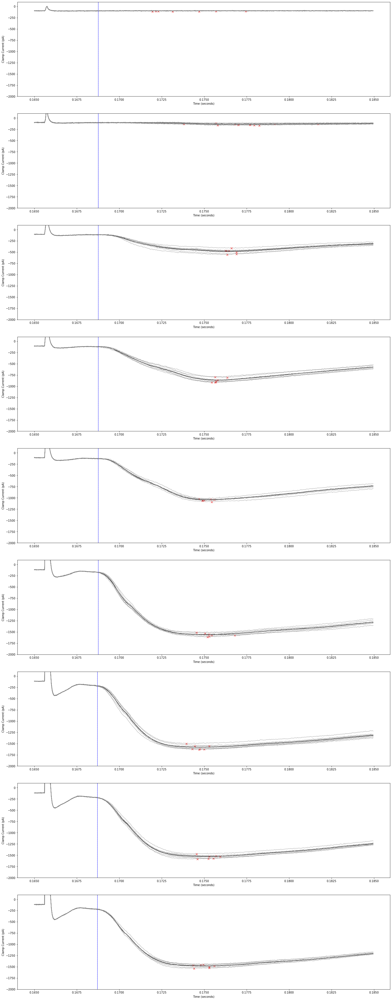

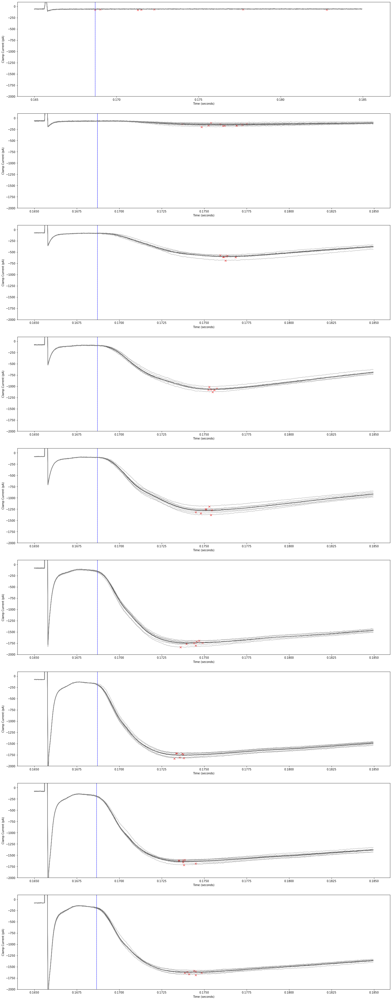

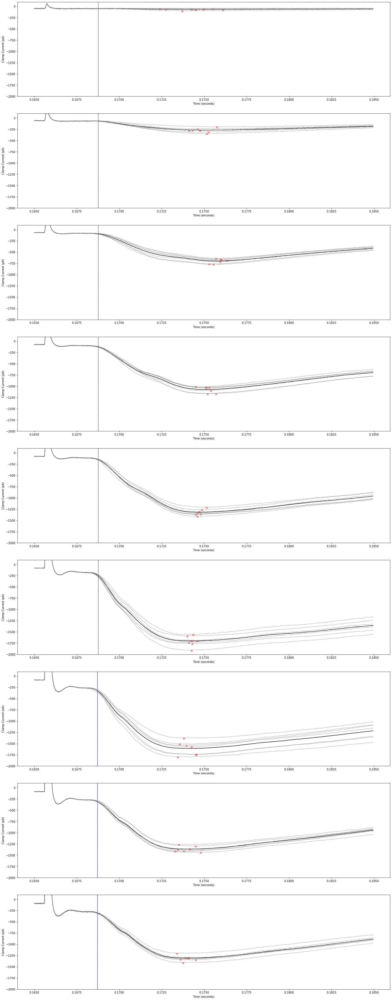

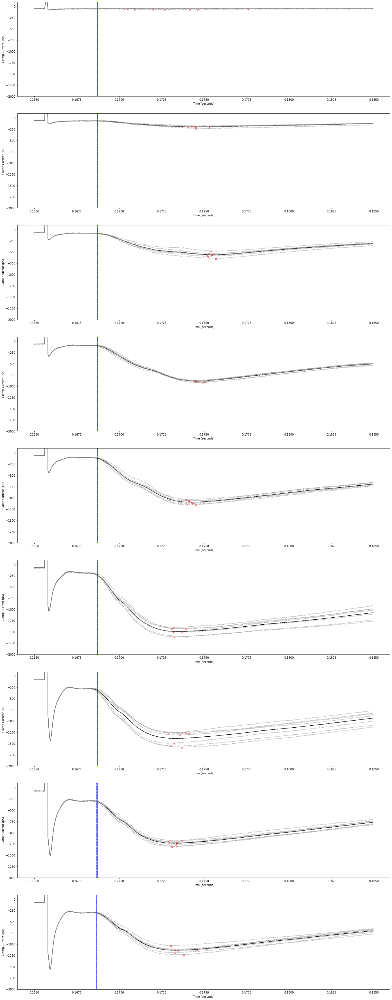

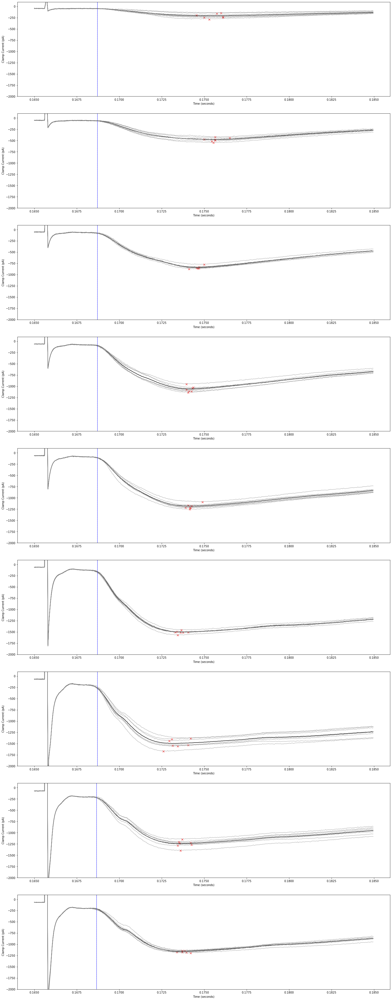

...

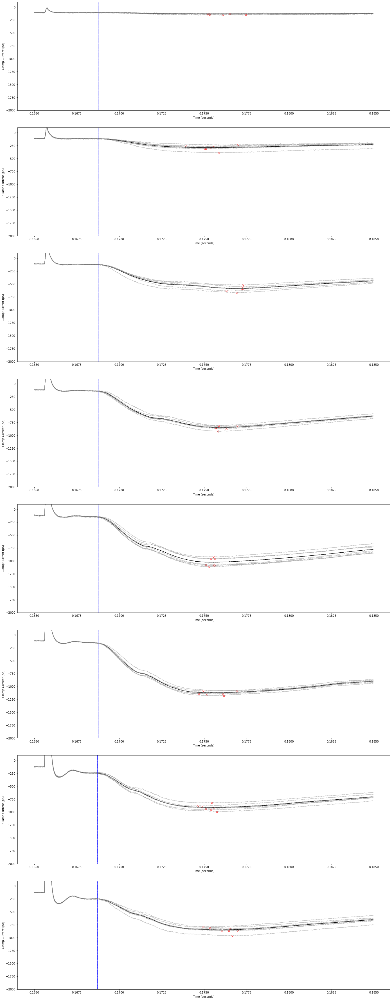

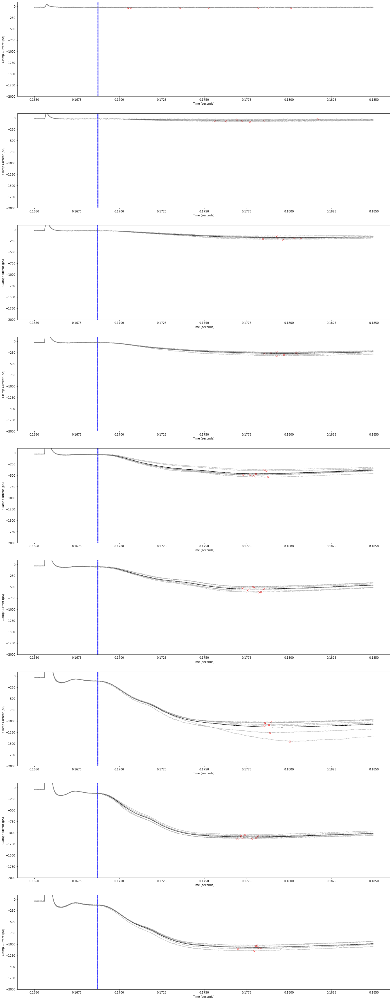

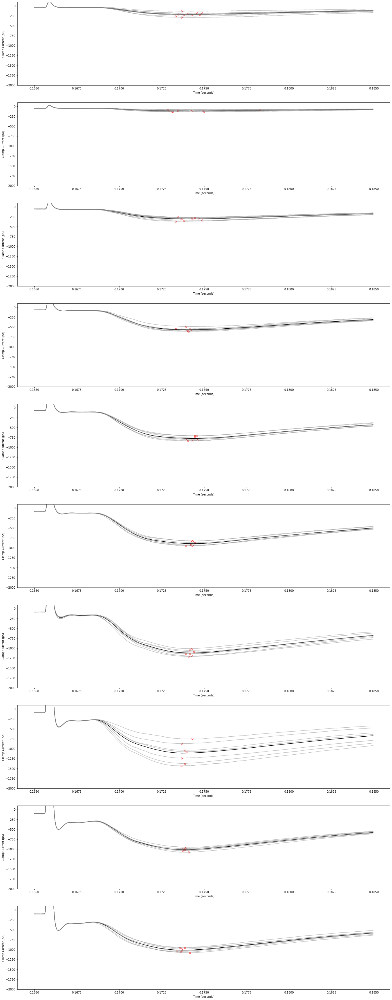

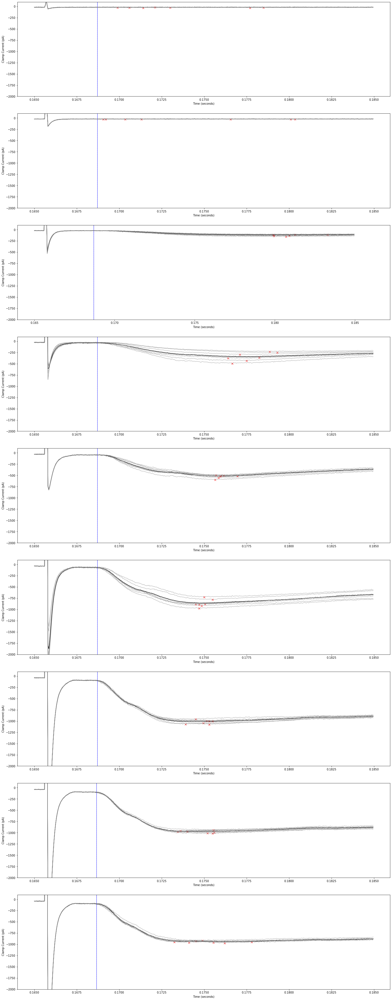

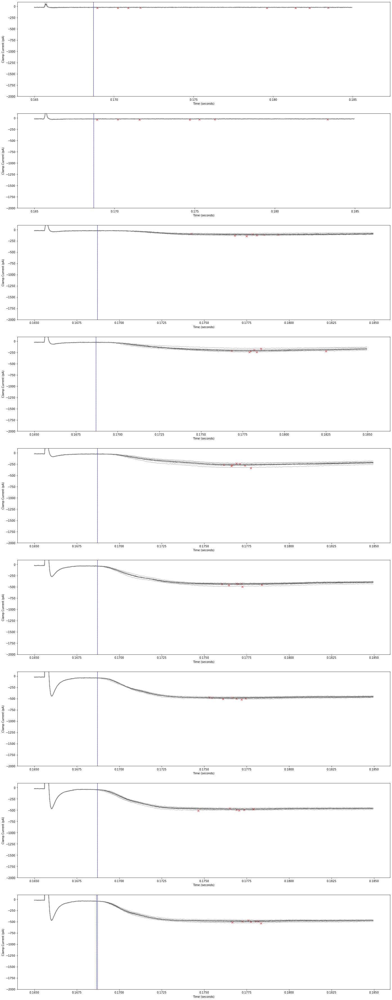

In [326]:
#Run this one!
path = askdirectory(title='Select Folder with all data from one experiment') # shows dialog box and return the path 
os.chdir(path)

if os.path.exists('.DS_Store') == True: #external drive issue with Adrian's computer, shouldn't hurt anything
    os.remove('.DS_Store')          
gen_dir = os.getcwd()
mouse_folders = os.listdir('.')

# Go to each folder in dataset that corresponds to one mouse
for mouse in mouse_folders:
    mouse_dir = gen_dir + '/' + mouse # get directory for one mouse
    os.chdir(mouse_dir)  #change directory to that mouse
    if os.path.exists('.DS_Store') == True: # external drive again
        os.remove('.DS_Store')    
    mouse_wd = os.getcwd() 
    cell_folders = os.listdir(mouse_wd) # list the cells (directories) of that mouse

# Get total number of cells for this mouse, create figure with specified columns of subplots
    #cell_total = int(get_cell_total(cell_folders))
    #stim_total = int(9) #hard-coded for now
    
    #stim_list = range(stim_total)
    #true_cell_ind = 1

# Go to each subfolder that corresponds to each cell of one mouse    
    for cell in cell_folders:
        if cell == '.DS_Store':
            os.remove('.DS_Store')    
        elif 'cell' in cell and 'processed' not in cell and 'IClamp' not in cell:
            processed_file = cell + '_processed'
            processed_dir = mouse_wd + '/' + processed_file
            if not os.path.exists(processed_dir):
                os.mkdir(processed_dir)
            cell_dir = mouse_dir + '/' + cell
            os.chdir(cell_dir)# change directory to one cell of one mouse
            cell_wd = os.getcwd()
            if os.path.exists('.DS_Store') == True: # external drive again
                os.remove('.DS_Store')       
            
# Create metadata in case its not there already            
            contents = os.listdir(cell_wd) # list all contents of this cell
            all_header_files = get_txt_metadata(mouse,contents) 
            all_csv_files = get_csv_metadata(all_header_files)
            
# KEY STEP - get metadata from experiment excel files (from lab notes)            
            new_contents = os.listdir('.')
            stim_int, cellnum, valid_ABFs = get_xlxs_data(mouse,new_contents)
            valid_CSVs = df_prep_v2(mouse,valid_ABFs,new_contents)
            
# Generate dataframes and save onto _processed folder in mouse directory, one per each cell (could be 2 per cell folder)
            cell_channels = [*range(cellnum)]  
            for ch in cell_channels:
                ch_ind = ch*2
                cell_ID = ch + 1
                print(valid_ABFs)
                summary,all_peak_times, cell_fig, = data_summary_percell_v3(cell,ch_ind, valid_ABFs, valid_CSVs, stim_int)
                summ_path = processed_dir + '/' + cell + '_' + str(cell_ID) + '_summary.csv'
                tp_path = processed_dir + '/'  + cell + '_' + str(cell_ID) + '_timepoints.csv'
                plot_path = processed_dir + '/'  + cell + '_' + str(cell_ID) + '_plot'
                
                summary.to_csv(summ_path, index = True)
                all_peak_times.to_csv(tp_path, index = True)
                plt.savefig(plot_path)

For convenience and easy compiling of plots, we need to write a function that takes every figure object and adds it to a master plot with many subplots. It is important here to have the title recapitulate the identity of this trace so that it is more informative, especially if the data in question contains different genotypes. Atlernatively, we can use the new plotting function `plot_mean_sweep_with_all_sweeps` as a nested function in whatever we use to generatethe plot, so that we don't need to use figure handles, in the case that they are not possible to couple with subplot axes. Ideally we want to create a figure at the level of `mouse`, so we can see all of the cells of that mouse in a single figure.

We start by writing a function that takes a similar route as our script above, but only obtains the total number of cells per mouse folder. This will be used to obtain the column number for our master figure, where the rows will depend on the length of stimulus intensities (for now we consider it a hard-coded `9`). 

UPDATE: Given the convolution of indexing two separate things separately and space issues regarding the plots for each mouse, I resorted to just compiling all the plots of one cell. Later on I could implement this logic for a combination of all of these plots.

In [327]:
#Junky code that I never managed to use but can be useful later
'''
#Add this cell into master figure
                for abf_file in valid_ABFs:    
                    abf = pyabf.ABF(abf_file)
                    csv_i = valid_ABFs.index(abf_file)
                    peak_pA,peak_pA_ind,peak_pA_s,latency_s,skipped_win,traces,trace_times = get_peak_pA_v3(
                        ch_ind,abf,valid_CSVs[csv_i])
                    for x in stim_list:
                        plot_ind = true_cell_ind + x*cell_total
                        print(stim_total,cell_total,plot_ind)
                        plt.subplot(stim_total,cell_total,plot_ind)
                        i1 = 3250 
                        i2 = 3700
                        mean_trace = get_mean_trace(abf,1)
                        abf.setSweep(1)
                        mean_trace = get_mean_trace(abf,ch_ind)
                        dataX = abf.sweepX[i1:i2]
                        dataY = mean_trace[i1:i2]
                        plt.scatter(x=peak_pA_s, y=peak_pA, s=10, alpha=0.7, color='r', marker ='x')
                        plt.plot(dataX,dataY,color='black')
                        plt.ylim(-2000,1500)
    
                        for i in abf.sweepList:
                            trace = traces[i]
                            time = trace_times[i]
                            plt.axvline(x=skipped_win[i],color='blue',ymin =0.0, ymax=1.0,linestyle='--',linewidth=0.5)
                            plt.plot(time[i1:i2],trace[i1:i2],color='gray',alpha=0.5)
            true_cell_ind = true_cell_ind + 1        
#Save dataframes onto their "processed" folders                        
    master_fig_path = '/Users/adrianalejandro/Desktop/master_fig' 
    plt.savefig(master_fig_path)
'''
def get_cell_total(cell_folders):
    parameter = 'channelList'
    cells = []
    for cell in cell_folders:
        
        if cell == '.DS_Store':
            os.remove('.DS_Store')    
        
        elif 'cell' in cell and 'processed' not in cell:
            cell_dir = mouse_dir + '/' + cell
            os.chdir(cell_dir)# change directory to one cell of one mouse
            cell_wd = os.getcwd()
            if os.path.exists('.DS_Store') == True: # external drive again
                os.remove('.DS_Store')
            contents = os.listdir(cell_wd)
            found = False
            for file in contents:
                if found != True:
                    if '.csv' in file:
                        found = True
                        raw_str = get_metadata_values(file,parameter)
                        channel_str = raw_str.strip('][').split(', ')
                        channel_list = []
                        for x in channel_str:
                            channel_list.append(int(x.strip().strip('][')))
                        num_cells = len(channel_list)/2
                        cells.append(num_cells)
    cell_total = sum(cells)
    return cell_total

Up to now we have included or corrected for the following:

1. Included plots of every abf file that corresponds to a presynaptic stimulus intensity in a plot saved onto each folder for 1 cell. 
2. Checked calculation for resistances and it seems valid, but further testing will include both plotting (and later saving using a similar scheme as for the current traces) I and Vm traces together to check for any bugs or artifacts
3. Used the excel files containing the stimulus intensities as a (highly) dependent index for the stimulus intensities, number of abf files, and number of cells. This las term, `cellnum`, can be automatically accessed for each cell through `channelList`, but more on that later. 

There are now dataframes per each cell that can be compiled, summarized even further, or managed to begin comparing effects between genotypes (or mice). Visual inspection of all the plots can serve as a quality control step and adjustments on the excel files can be made accordingly to add any flags. 